---
# Create MOM6 bathymetry files for CESM3 LGM
- Author: Jiang Zhu (jiangzhu@ucar.edu)
- Objective: Generate MOM6 bathymetry files for the Last Glacial Maximum (LGM) for CESM3, accounting for ICE-6G sea-level changes and applying necessary clean-up and regional adjustments to ensure numerical stability.
- Workflow: starts from an existing preindustrial MOM6 bathymetry and add changes.
  - Inspect preindustrial MOM6 bathymetry.
  - Inspect ICE-6G preindustrial and LGM fields.
  - Step 1: Apply LGM sea-level lowering and update land–sea mask.
  - Step 2: Run `fill_holes` to fill isolated/inland ocean
  - Step 3: Mannually remove very small islands.
  - Step 4: Apply targeted regional edits (e.g., Sea of Japan, Red Sea, Black Sea).
  - Step 5: Save the full set of MOM6 bathymetry-related files required by CESM3.
- Tools used
  - [mom6_bathy](https://ncar.github.io/mom6_bathy/index.html) by Alper Altuntas
    - Follow the instruction there and create an environment that includes mom6_bathy
- Other references
  - [Notebook](https://github.com/NCAR/tx2_3/tree/main/topography) for preindustrial files by Frank Bryan and Gustavo Marques et al.
    - Including [this notebook](https://github.com/NCAR/tx2_3/blob/main/topography/Append_topo_edits.ipynb) to add additional modifications
  - [MOM6 supergrid](https://mom6.readthedocs.io/en/main/api/generated/pages/Discrete_Grids.html)
- Notes
  - The MOM6 grid and supergrid are unchanged; only bathymetry and masks are modified.
  - Manual edits are localized, conservative, and documented for reproducibility.
---

In [1]:
import datetime

import numpy as np
import hvplot.xarray
import xarray as xr
import matplotlib.pyplot as plt
import xesmf

import cartopy.crs as ccrs
import cartopy.mpl.ticker as cticker
import cartopy.feature as cfeature

from mom6_bathy.grid import Grid
from mom6_bathy.topo import Topo

import warnings
warnings.filterwarnings('ignore')

---
## Input

In [2]:
mom_dir = '/glade/campaign/cesm/cesmdata/inputdata/ocn/mom/tx2_3v2'
mom_supergird = f"{mom_dir}/ocean_hgrid_221123.nc"
mom_topo = f"{mom_dir}/ocean_topo_tx2_3v2_240501.nc"
mom_topo_edits = f"{mom_dir}/topo_edits_tx2_3v2_250107.nc"

# Use ICE-6G to get effects from sea level change on ocean bathymetry
i6g_dir = '/glade/campaign/cesm/development/palwg/raw_boundary_data/ice-6g_c/'
i6g_21ka = f"{i6g_dir}/I6_C.VM5a_1deg.21.nc"
i6g_00ka = f"{i6g_dir}/I6_C.VM5a_1deg.0.nc"

# Use old POP LGM bathymetry file for comparison with the new MOM bathymetry
pop_21ka = '/glade/work/jiangzhu/data/pop_grid_kmt_rmask_gx1v7_21ka.240322.nc'

---
## Output

In [3]:
today = datetime.date.today().strftime("%y%m%d")
print(today)

work_dir = '/glade/work/jiangzhu/data/inputdata/mom/tx2_3v2'
mom_topo_21ka = f"{work_dir}/ocean_topo_tx2_3v2_240501_21ka_{today}.nc"
cice_grid_21ka = f"{work_dir}/cice_grid_tx2_3v2_240501_21ka_{today}.nc"
mom_mesh_21ka = f"{work_dir}/tx2_3v2_ESMFmesh_230415_21ka_{today}.nc"
mom_scrip_21ka = f"{work_dir}/tx2_3v2_SCRIP_230415_21ka_{today}.nc"

KH_BG_21ka = f"{work_dir}/tx2_3v2_KH_BG_21ka_{today}.nc"

260223


---
## Helper functions
- `pad_lat` to pad 90°N and 90°S to ICE-6G data for interpolation

In [4]:
def pad_lat(ds, lon_name="lon", lat_name="lat"):
    """
    Pad latitude if ds does not already cover [-90, 90] in lat.
    """
    out = ds.copy()
    lon = out[lon_name]
    lat = out[lat_name]

    # ---- Pad latitude ----
    if lat.min() > -90:
        south_pad = out.isel({lat_name: 0}).expand_dims({lat_name: [-90]})
        out = xr.concat([south_pad, out], dim=lat_name)

    if lat.max() < 90:
        north_pad = out.isel({lat_name: -1}).expand_dims({lat_name: [90]})
        out = xr.concat([out, north_pad], dim=lat_name)

    return out

- `fill_holes` to fill inland oceans

In [5]:
def fill_holes(i, j, field, xcyclic=True, tripolar=True):
    """
    An iterative (stack based) implementation of "Ice 9", used to fill holes

    The flood fill starts at [j,i] and treats any positive value of "field" as
    passable. Zero and negative values block flooding.

    xcyclic = True allows cyclic behavior in the last index. (default)
    tripolar = True allows a fold across the top-most edge. (default)
    """

    field_new = field * 0.
    (nj, ni) = field_new.shape
    stack = set()
    stack.add((j, i))

    while stack:
        (j, i) = stack.pop()

        if field_new[j, i] or field[j, i] <= 0:
            continue
        field_new[j, i] = field[j, i]

        if i > 0:
            stack.add((j, i-1))
        elif xcyclic:
            stack.add((j, ni-1))

        if i < ni-1:
            stack.add((j, i+1))
        elif xcyclic:
            stack.add((j, 0))

        if j > 0:
            stack.add((j-1, i))

        if j < nj-1:
            stack.add((j+1, i))
        elif tripolar:
            stack.add((j, ni-1-i))  # Tri-polar fold

    return field_new

- `fill_na` to fill nan with nearest neighbors

In [6]:
def fill_na(da, lon_name, lat_name, n_points=1):
    while da.isnull().any():
        da = da.ffill(dim=lon_name, limit=n_points)
        da = da.bfill(dim=lon_name, limit=n_points)
        da = da.ffill(dim=lat_name, limit=n_points)
        da = da.bfill(dim=lat_name, limit=n_points)
    return da

- More functions used to modify depth and make plots for checking & comparing with POP LGM

In [7]:
def replace_depth_box(depth, depth_to_use, i_bin, j_bin):
    """
    Replace depth in a box (i_bin, j_bin) with depth_to_use
    """
    depth[i_bin[0]:i_bin[1], j_bin[0]:j_bin[1]] = depth_to_use[i_bin[0]:i_bin[1], j_bin[0]:j_bin[1]]


def mom6_latlon2ij(lon2D, lat2D, lon, lat, max_iter=10):
    """
    Find the nearest grid point (i,j) for a given lon/lat in a curvilinear MOM6 grid.
    Handles longitude wrapping.
    """
    ilast = jlast = -1
    jpt = np.abs(lat2D[:, 0]).argmin().values  # start near equator

    n = 0
    while (ilast != jpt and jlast != jpt and n < max_iter):
        lo = 0.
        if lon < lon2D[jpt, :].min(): lo = 360.
        if lon > lon2D[jpt, :].max(): lo = -360.

        ilast, jlast = jpt, jpt
        ipt = np.abs(lon2D[jpt, :] - (lon + lo)).argmin().values
        jpt = np.abs(lat2D[:, ipt] - lat).argmin().values
        n += 1

    return ipt, jpt


def plot_depth(depth1, depth2, ds_mom_prei, ds_pop_21ka,
               lonbeg, lonend, latbeg, latend, skip=5,
               titles=('Preindustrial', 'LGM')):
    """
    Plot two MOM6 depth fields and POP KMT side by side with coastlines,
      curvilinear grids, and optional index annotations.
    """

    geolon, geolat = ds_mom_prei.geolon, ds_mom_prei.geolat
    geolonb, geolatb = ds_mom_prei.geolonb, ds_mom_prei.geolatb

    fig, axes = plt.subplots(1, 3, figsize=(16, 6),
                             constrained_layout=True,
                             sharex=True, sharey=True,
                             subplot_kw={'projection': ccrs.PlateCarree()})
    plt.set_cmap('PuBuGn')

    for depth, ax, title in zip([depth1, depth2], axes[:2], titles):
        nlath, nlonh = depth.shape

        # Determine i,j corners
        ivals = np.array([mom6_latlon2ij(geolon, geolat, lon, lat)
                          for lon, lat in [(lonbeg, latbeg),
                                           (lonend, latbeg),
                                           (lonend, latend),
                                           (lonbeg, latend)]])
        imin, imax = max(ivals[:,0].min()-1, 0), min(ivals[:,0].max()+1, nlonh)
        jmin, jmax = max(ivals[:,1].min()-1, 0), min(ivals[:,1].max()+1, nlath)

        # Handle tripolar/top-boundary case
        if latend > 65:
            imin, imax = 0, nlonh
            jmax = nlath

        # Optional longitude wrapping
        lo = 360. if lonbeg < -180 else 0.

        # Plot depth
        pc = ax.pcolormesh(geolon[jmin:jmax, imin:imax] + lo,
                           geolat[jmin:jmax, imin:imax],
                           depth[jmin:jmax, imin:imax],
                           vmin=0, vmax=300)
        # Contour zero-depth
        ax.contour(geolon[jmin:jmax, imin:imax] + lo,
                   geolat[jmin:jmax, imin:imax],
                   depth[jmin:jmax, imin:imax],
                   levels=[0.5], colors='black', linewidths=1.5, linestyles='dashed')

        ax.set_xlim(lonbeg+lo, lonend+lo)
        ax.set_ylim(latbeg, latend)
        ax.add_feature(cfeature.COASTLINE, color='darkgrey')
        ax.set_title(title)

        # Grid lines
        ax.set_xticks(np.arange(lonbeg+lo, lonend+lo, 5), crs=ccrs.PlateCarree())
        ax.set_yticks(np.arange(latbeg, latend, 5), crs=ccrs.PlateCarree())
        ax.xaxis.set_major_formatter(cticker.LongitudeFormatter())
        ax.yaxis.set_major_formatter(cticker.LatitudeFormatter())

        # Plot boundaries
        for i in range(imin, imax):
            ax.plot(geolonb[:, i]+lo, geolatb[:, i], color='grey', linewidth=0.5)
        for j in range(jmin, jmax):
            ax.plot(geolonb[j, :]+lo, geolatb[j, :], color='grey', linewidth=0.5)

        # Optional (i,j) annotations
        for j in range(jmin, jmax, skip):
            for i in range(imin, imax, skip):
                if latbeg < geolat[j, i] < latend and lonbeg+lo < geolon[j, i]+lo < lonend+lo:
                    ax.text(geolon[j, i]+lo, geolat[j, i], f"({j},{i})",
                            ha='center', va='center', fontsize=8)

    # Colorbar for MOM6
    fig.colorbar(pc, ax=axes[:2], shrink=0.5)

    # Plot POP KMT in third panel
    ax = axes[2]
    pop_tlat, pop_tlon = ds_pop_21ka.TLAT, ds_pop_21ka.TLONG
    pop_kmt_box = ds_pop_21ka.KMT.where(
        (pop_tlon > lonbeg+lo) & (pop_tlon < lonend+lo) &
        (pop_tlat > latbeg) & (pop_tlat < latend), drop=True)
    pc = ax.pcolormesh(pop_kmt_box.TLONG, pop_kmt_box.TLAT, pop_kmt_box,
                       vmin=0, vmax=20)
    ax.set_title('POP LGM KMT')
    fig.colorbar(pc, ax=ax, shrink=0.5)

---
## Use mom6_bathy to create MOM6 grid/topo objects from the preindustrial files

In [8]:
grid = Grid.from_supergrid(mom_supergird)
topo = Topo.from_topo_file(grid, mom_topo)

# topo_min_depth = 2.5
# print(topo.min_depth)
print(f"Max/min of depth    : {topo.depth.max().values: 8.2f}, {topo.depth.min().values: 8.2f}")
print(f"Max/min of latitude : {grid.tlat.max().values: 8.2f}, {grid.tlat.min().values: 8.2f}")
print(f"Max/min of longitude: {grid.tlon.max().values: 8.2f}, {grid.tlon.min().values: 8.2f}")

depth_old = topo.depth.rename('depth').copy()
depth_old

Max/min of depth    :  8128.72,     0.00
Max/min of latitude :    89.86,   -81.56
Max/min of longitude:    73.00,  -287.00


<xarray.DataArray 'depth' (ny: 480, nx: 540)>
array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)
Dimensions without coordinates: ny, nx
Attributes:
    units:    m

In [9]:
ds_mom_grid = grid.tlat.to_dataset(name='lat')
ds_mom_grid['lon'] = grid.tlon
ds_mom_grid

<xarray.Dataset>
Dimensions:  (ny: 480, nx: 540)
Dimensions without coordinates: ny, nx
Data variables:
    lat      (ny, nx) float64 -81.56 -81.56 -81.56 -81.56 ... 50.27 50.11 49.99
    lon      (ny, nx) float64 -286.7 -286.0 -285.3 -284.7 ... 72.97 72.98 73.0

### Apply additional edits
- NOTE: some MOM grid points are edited multiple times

In [10]:
ds_topo_edits = xr.open_dataset(mom_topo_edits)

i = ds_topo_edits["iEdit"].values.astype(int)
j = ds_topo_edits["jEdit"].values.astype(int)
z = ds_topo_edits["zEdit"].values

print(f"depth shape: {depth_old.shape}")
print(f"max iEdit: {i.max()}")
print(f"max jEdit: {j.max()}")
print(f"max zEdit: {ds_topo_edits.zEdit.max().values}")
print(f"min zEdit: {ds_topo_edits.zEdit.min().values}")

arr = depth_old.values.copy()
for jj, ii, zz in zip(j, i, z):
    arr[jj, ii] = zz

topo.depth.data = arr
# topo.min_depth = topo_min_depth

depth shape: (480, 540)
max iEdit: 516
max jEdit: 415
max zEdit: 5087.0
min zEdit: 18.76994514465332


In [11]:
depth_prei = topo.depth.copy(deep=True)

### Check results for a specific edit and make plots

In [12]:
k = 100
ii, jj, zz = i[k], j[k], z[k]
z_all = z[(i == ii) & (j == jj)]  # Find all edits for this grid point

print("\nCheck ...")
print(f"MOM index edited: j={jj}, i={ii}")
print(f"All zEdit values for this grid point: {z_all}")
print(f"Final applied value in depth_new: {topo.depth.values[jj, ii]}")
print(f"Original depth_old value: {depth_old.values[jj, ii]}")

p1 = depth_old.hvplot.quadmesh(rasterize=True, cmap="viridis", title="PI Topo")
p2 = topo.depth.hvplot.quadmesh(rasterize=True, cmap="viridis", title="PI Topo with lattest edits")
p3 = (topo.depth - depth_old).hvplot.quadmesh(rasterize=True, cmap="BuRd_r", title="Latest edits")

(p1 + p2 + p3).cols(2)


Check ...
MOM index edited: j=258, i=369
All zEdit values for this grid point: [4308.16259766 4454.73144531 4454.73144531]
Final applied value in depth_new: 4454.7314453125
Original depth_old value: 4259.89990234375


:Layout
   .DynamicMap.I   :DynamicMap   []
      :Image   [nx,ny]   (depth)
   .DynamicMap.II  :DynamicMap   []
      :Image   [nx,ny]   (value)
   .DynamicMap.III :DynamicMap   []
      :Image   [nx,ny]   (value)

---
## Read and plot mom6 preindustrial topography
- MOM6 ocean_topog uses _real_ depth in meters
- MOM6 ocean_topog uses simple 0-1 land-sea mask with _NO marginal seas_

In [13]:
ds_mom_prei = xr.open_dataset(mom_topo)

ds_mom_prei

<xarray.Dataset>
Dimensions:     (lonh: 540, lath: 480, lonq: 541, latq: 481, nEdits: 25)
Coordinates:
  * lonh        (lonh) float64 -286.7 -286.0 -285.3 -284.7 ... 71.33 72.0 72.67
  * lath        (lath) float64 -81.56 -81.46 -81.36 -81.26 ... 89.33 89.6 89.86
  * lonq        (lonq) float64 -287.0 -286.3 -285.7 -285.0 ... 71.67 72.33 73.0
  * latq        (latq) float64 -81.61 -81.51 -81.41 -81.31 ... 89.46 89.72 89.91
Dimensions without coordinates: nEdits
Data variables: (12/19)
    geolon      (lath, lonh) float64 ...
    geolat      (lath, lonh) float64 ...
    geolonb     (latq, lonq) float64 ...
    geolatb     (latq, lonq) float64 ...
    z           (lath, lonh) float32 ...
    ocn_frac    (lath, lonh) float32 ...
    ...          ...
    orig_mask   (lath, lonh) int32 ...
    D_interp    (lath, lonh) float32 ...
    depth       (lath, lonh) float32 ...
    iEdit       (nEdits) int32 ...
    jEdit       (nEdits) int32 ...
    zEdit       (nEdits) float64 ...
Attributes:
    Description:               Ocean Topography Statistics on MOM6 Grid
    Creator:                   Frank Bryan (bryan@ucar.edu)
    Created:                   20240216
    Generating Code:           create_model_topo.f90
    Model Grid Version:        tx2_3v2
    Source Topography Data:    /glade/campaign/cgd/oce/datasets/obs/SRTM/SRTM...
    Edit History:              Hand Edit + Lake Fill 02/16/2024
    Manual edits updated on::  2024-05-01T15:28:43.496410
    By::                       Gustavo Marques (gmarques@ucar.edu)
    url:                       https://github.com/NCAR/tx2_3/topography/Appen...

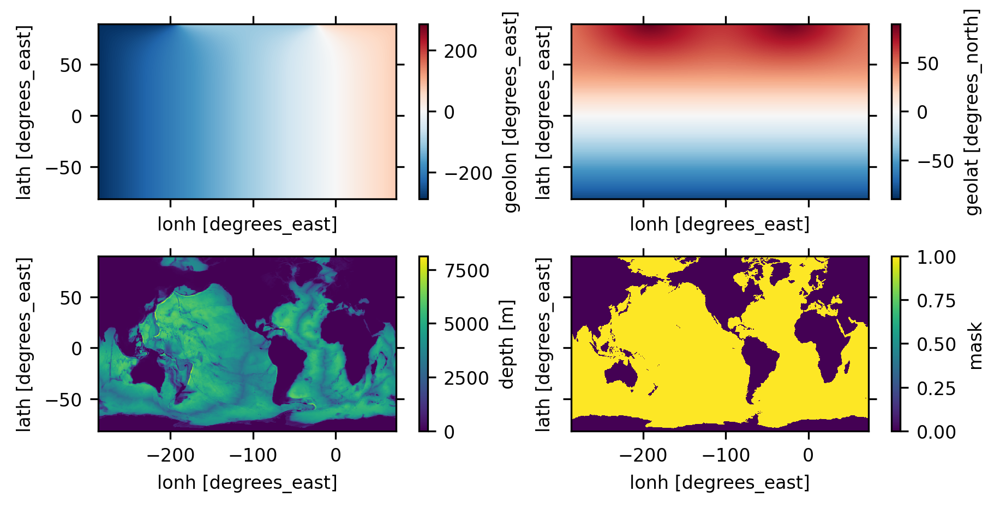

In [14]:
fig, axes = plt.subplots(2, 2, figsize=(6, 3),
                         sharex=True, sharey=True,
                         constrained_layout=True)

for ax, var in zip(axes.ravel(), ['geolon', 'geolat', 'depth', 'mask']):
    ds_mom_prei[var].plot(ax=ax)

---
## Read and plot POP LGM topography
- fixed depth levels (0-60) in POP
- marginal seas in negative index of REGION_MASK

In [15]:
ds_pop_21ka = xr.open_dataset(pop_21ka)
print(f"POP vertical grid in m: {ds_pop_21ka.z_t.values/100}")
ds_pop_21ka

POP vertical grid in m: [5.00000000e+00 1.50000000e+01 2.50000000e+01 3.50000000e+01
 4.50000000e+01 5.50000000e+01 6.50000000e+01 7.50000000e+01
 8.50000000e+01 9.50000000e+01 1.05000000e+02 1.15000000e+02
 1.25000000e+02 1.35000000e+02 1.45000000e+02 1.55000000e+02
 1.65098404e+02 1.75479050e+02 1.86291268e+02 1.97660278e+02
 2.09711379e+02 2.22578285e+02 2.36408829e+02 2.51370163e+02
 2.67654191e+02 2.85483651e+02 3.05119224e+02 3.26867997e+02
 3.51093492e+02 3.78227603e+02 4.08784664e+02 4.43377712e+02
 4.82736729e+02 5.27728001e+02 5.79372891e+02 6.38862622e+02
 7.07563306e+02 7.87002493e+02 8.78825247e+02 9.84705867e+02
 1.10620419e+03 1.24456691e+03 1.40049717e+03 1.57394639e+03
 1.76400324e+03 1.96894419e+03 2.18645653e+03 2.41397155e+03
 2.64900126e+03 2.88938459e+03 3.13340457e+03 3.37979354e+03
 3.62767025e+03 3.87645176e+03 4.12576809e+03 4.37539251e+03
 4.62519029e+03 4.87508346e+03 5.12502805e+03 5.37499982e+03]


<xarray.Dataset>
Dimensions:      (nlat: 384, nlon: 320, z_t: 60, z_w: 60, z_w_bot: 60, nreg: 14)
Coordinates:
    TLAT         (nlat, nlon) float64 ...
    TLONG        (nlat, nlon) float64 ...
    ULAT         (nlat, nlon) float64 ...
    ULONG        (nlat, nlon) float64 ...
  * z_t          (z_t) float64 500.0 1.5e+03 2.5e+03 ... 5.125e+05 5.375e+05
  * z_w          (z_w) float64 0.0 1e+03 2e+03 3e+03 ... 4.75e+05 5e+05 5.25e+05
  * z_w_bot      (z_w_bot) float64 1e+03 2e+03 3e+03 ... 5e+05 5.25e+05 5.5e+05
  * nreg         (nreg) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13
Dimensions without coordinates: nlat, nlon
Data variables:
    DXT          (nlat, nlon) float64 ...
    DYT          (nlat, nlon) float64 ...
    DXU          (nlat, nlon) float64 ...
    DYU          (nlat, nlon) float64 ...
    TAREA        (nlat, nlon) float64 ...
    UAREA        (nlat, nlon) float64 ...
    KMT          (nlat, nlon) int32 ...
    REGION_MASK  (nlat, nlon) int32 ...
    dz           (z_t) float64 ...
    region_name  (nreg) <U21 ...
    region_val   (nreg) int64 ...
Attributes:
    lateral_dims:       [384 320]
    vertical_dims:      60
    vert_grid_file:     gx1v7_vert_grid
    horiz_grid_fname:   inputdata/ocn/pop/gx1v6/grid/horiz_grid_20010402.ieeer8
    topography_fname:   inputdata/ocn/pop/gx1v6/grid/topography_20090204.ieeei4
    region_mask_fname:  inputdata/ocn/pop/gx1v6/grid/region_mask_20090205.ieeei4
    type:               dipole
    title:              POP_gx1v6 grid

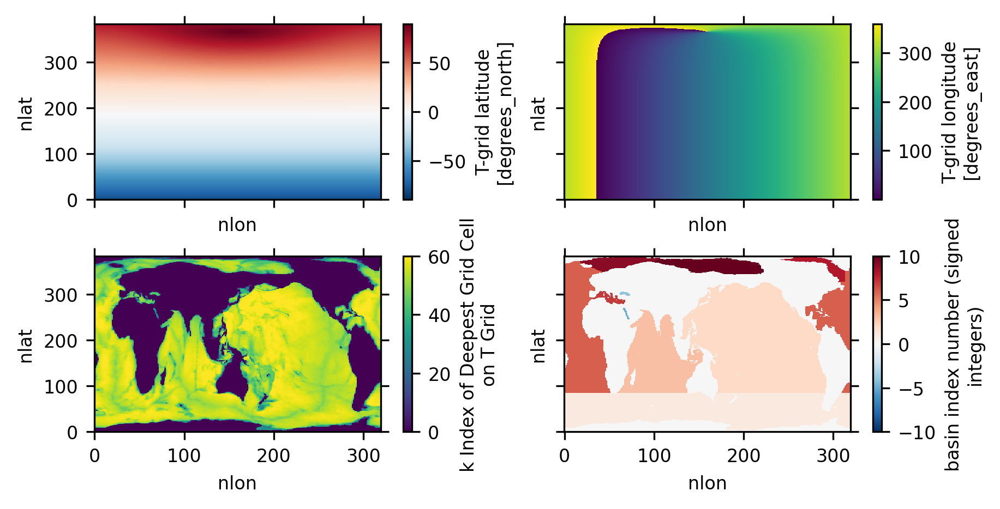

In [16]:
fig, axes = plt.subplots(2, 2, figsize=(6, 3),
                         sharex=True, sharey=True,
                         constrained_layout=True)

for ax, var in zip(axes.ravel(), ['TLAT', 'TLONG', 'KMT', 'REGION_MASK']):
    ds_pop_21ka[var].plot(ax=ax)

---
## Create LGM topo for MOM6 
- Note: MOM6 PI bathymetry and land-sea fraction could be inconsistent with those in ICE-6G
- Step 1: Lower ocean depth by sea-level changes in ICE-6G
- Step 2: Run fill_holes to fill "inland" ocean
- Step 3: Remove tiny islands manually
- Step 4: Further modifications: Sea of Japan, Red Sea, Black Sea ...
- Step 5: Save a suite of files requried for setting up CESM3

### Step 1: Lower ocean depth by sea-level changes in ICE-6G
- Ref: https://www.atmosp.physics.utoronto.ca/~peltier/data.php
- `Topo`: topography; `orog`: Surface altitude; `stflf`: land area fraction; `stgif`: ice area fraction
- ***Topography includes bathymetry and for an ice-shelf, orog will give the ice surface whereas Topo will give the ocean depth.***

In [17]:
ds_21ka_i6g = xr.open_dataset(i6g_21ka)
ds_00ka_i6g = xr.open_dataset(i6g_00ka)

ds_21ka_i6g

<xarray.Dataset>
Dimensions:    (lat: 180, lon: 360)
Coordinates:
  * lat        (lat) float32 -89.5 -88.5 -87.5 -86.5 ... 86.5 87.5 88.5 89.5
  * lon        (lon) float32 0.5 1.5 2.5 3.5 4.5 ... 356.5 357.5 358.5 359.5
Data variables:
    sftlf      (lat, lon) float32 ...
    sftgif     (lat, lon) float32 ...
    Topo_Diff  (lat, lon) float32 ...
    Topo       (lat, lon) float32 ...
    orog       (lat, lon) float32 ...
    stgit      (lat, lon) float32 ...
Attributes:
    Model:            ICE=ICE-6G_C, Viscosity=VM5a
    Date:             November 14,2014
    Author:           W.R. Peltier, Dept of Physics, Univ of Toronto,Canada
    Acknowledgement:  Please cite both PAPER1[describes the new Antarctic com...
    PAPER1:           Argus, D.F., Peltier, W.R., Drummond, R. and Moore, A.W...
    PAPER2:           Peltier, W.R., Argus, D.F. and Drummond, R. - Space geo...

In [18]:
# Padding only make very minor differences
ds_00ka_i6g = pad_lat(ds_00ka_i6g)
ds_21ka_i6g = pad_lat(ds_21ka_i6g)
ds_21ka_i6g

<xarray.Dataset>
Dimensions:    (lat: 182, lon: 360)
Coordinates:
  * lat        (lat) float64 -90.0 -89.5 -88.5 -87.5 ... 87.5 88.5 89.5 90.0
  * lon        (lon) float32 0.5 1.5 2.5 3.5 4.5 ... 356.5 357.5 358.5 359.5
Data variables:
    sftlf      (lat, lon) float32 100.0 100.0 100.0 100.0 ... 0.0 0.0 0.0 0.0
    sftgif     (lat, lon) float32 100.0 100.0 100.0 100.0 ... 0.0 0.0 0.0 0.0
    Topo_Diff  (lat, lon) float32 90.88 90.92 90.97 91.02 ... 131.5 131.5 131.5
    Topo       (lat, lon) float32 2.848e+03 2.849e+03 ... -4.066e+03 -4.067e+03
    orog       (lat, lon) float32 2.848e+03 2.849e+03 2.851e+03 ... 0.0 0.0 0.0
    stgit      (lat, lon) float32 2.87e+03 2.87e+03 2.87e+03 ... 0.0 0.0 0.0
Attributes:
    Model:            ICE=ICE-6G_C, Viscosity=VM5a
    Date:             November 14,2014
    Author:           W.R. Peltier, Dept of Physics, Univ of Toronto,Canada
    Acknowledgement:  Please cite both PAPER1[describes the new Antarctic com...
    PAPER1:           Argus, D.F., Peltier, W.R., Drummond, R. and Moore, A.W...
    PAPER2:           Peltier, W.R., Argus, D.F. and Drummond, R. - Space geo...

#### Plot PI conditions

In [19]:
ice_grounded_00ka = xr.where(
    (ds_00ka_i6g.Topo > 0) & (ds_00ka_i6g.stgit > 0),
    ds_00ka_i6g.stgit,
    0
)

ice_shelves_00ka = xr.where(
    (ds_00ka_i6g.Topo <= 0) & (ds_00ka_i6g.stgit > 0),
    ds_00ka_i6g.stgit,
    0
)

bedrock_00ka = ds_00ka_i6g.Topo - ice_grounded_00ka

p1 = ds_00ka_i6g.Topo.hvplot.quadmesh(title='topography')
p2 = ds_00ka_i6g.orog.hvplot.quadmesh(title='orography')
p3 = ds_00ka_i6g.stgit.hvplot.quadmesh(title='ice thickness', clim=(0, 1000))
p4 = ice_grounded_00ka.hvplot.quadmesh(title='grounded ice', clim=(0, 1000))
p5 = ice_shelves_00ka.hvplot.quadmesh(title='ice shelves', clim=(0, 1000))
p6 = bedrock_00ka.hvplot.quadmesh(title='bed rock')

(p1 + p2 + p3 + p4 + p5 + p6).cols(2)

:Layout
   .QuadMesh.I   :QuadMesh   [lon,lat]   (Topography at time=0 Ka. (Point-value altitude))
   .QuadMesh.II  :QuadMesh   [lon,lat]   (orography at time=0 Ka. (Point-value surface altitude))
   .QuadMesh.III :QuadMesh   [lon,lat]   (Thickness of the Ice Sheet at time=0 Ka. (Point-value Thickness))
   .QuadMesh.IV  :QuadMesh   [lon,lat]   (value)
   .QuadMesh.V   :QuadMesh   [lon,lat]   (value)
   .QuadMesh.VI  :QuadMesh   [lon,lat]   (value)

#### Plot LGM conditions

In [20]:
ice_grounded_21ka = xr.where(
    (ds_21ka_i6g.Topo > 0) & (ds_21ka_i6g.stgit > 0),
    ds_21ka_i6g.stgit,
    0
)

ice_shelves_21ka = xr.where(
    (ds_21ka_i6g.Topo <= 0) & (ds_21ka_i6g.stgit > 0),
    ds_21ka_i6g.stgit,
    0
)

bedrock_21ka = ds_21ka_i6g.Topo - ice_grounded_21ka

p1 = ds_21ka_i6g.Topo.hvplot.quadmesh(title='topography')
p2 = ds_21ka_i6g.orog.hvplot.quadmesh(title='orography')
p3 = ds_21ka_i6g.stgit.hvplot.quadmesh(title='ice thickness', clim=(0, 1000))
p4 = ice_grounded_21ka.hvplot.quadmesh(title='grounded ice', clim=(0, 1000))
p5 = ice_shelves_21ka.hvplot.quadmesh(title='ice shelves', clim=(0, 1000))
p6 = bedrock_21ka.hvplot.quadmesh(title='bed rock')

(p1 + p2 + p3 + p4 + p5 + p6).cols(2)

:Layout
   .QuadMesh.I   :QuadMesh   [lon,lat]   (Topography at time=21 Ka. (Point-value altitude))
   .QuadMesh.II  :QuadMesh   [lon,lat]   (orography at time=21 Ka. (Point-value surface altitude))
   .QuadMesh.III :QuadMesh   [lon,lat]   (Thickness of the Ice Sheet at time=21 Ka. (Point-value Thickness))
   .QuadMesh.IV  :QuadMesh   [lon,lat]   (value)
   .QuadMesh.V   :QuadMesh   [lon,lat]   (value)
   .QuadMesh.VI  :QuadMesh   [lon,lat]   (value)

#### LGM changes

In [21]:
dtopo = ds_21ka_i6g.Topo - ds_00ka_i6g.Topo
dorog = ds_21ka_i6g.orog - ds_00ka_i6g.orog
diceh = ds_21ka_i6g.stgit - ds_00ka_i6g.stgit
drock = bedrock_21ka - bedrock_00ka
print(f"Bedrock max/min changes: {drock.max().values:.2f}, {drock.min().values:.2f}")

p1 = dtopo.hvplot.quadmesh(cmap="RdBu_r", clim=(-300, 300), title='topo changes')
p2 = dorog.hvplot.quadmesh(cmap="RdBu_r", clim=(-300, 300), title='orog changes')
p3 = diceh.hvplot.quadmesh(cmap="RdBu_r", clim=(-100, 100), title='iceh changes')
p4 = drock.hvplot.quadmesh(cmap="RdBu_r", clim=(-300, 300), title='bedrock changes')

(p1 + p2 + p3 + p4).cols(2)

Bedrock max/min changes: 162.85, -929.30


:Layout
   .QuadMesh.I   :QuadMesh   [lon,lat]   (Topo)
   .QuadMesh.II  :QuadMesh   [lon,lat]   (orog)
   .QuadMesh.III :QuadMesh   [lon,lat]   (stgit)
   .QuadMesh.IV  :QuadMesh   [lon,lat]   (value)

#### Apply the bedrock and grounded ice changes derived from ICE-6G
- LGM new bathymetry = PI + bedrock changes, with grounded ice considered as land

In [22]:
# Create modified depth field
depth_dSLV = depth_prei.copy(deep=True)

# Regrid bedrock and grounded-ice changes to the MOM6 grid.
# The MOM6 longitude uses a shifted but continuous range (e.g., [-287, 73)), equivalent to [0, 360).
# Changing the longitude values alone does not affect the regridding;
# the result depends on whether longitude is treated as periodic (periodic=True) or not.
regridder = xesmf.Regridder(
    ds_21ka_i6g,
    ds_mom_grid,
    method="bilinear",
    periodic=True
)

drock_mom6 = regridder(drock)
ice_grounded_21ka_mom6 = regridder(ice_grounded_21ka)

# Mod 1: Apply bedrock change and enforce non-negative bathymetry
depth_dSLV = (depth_dSLV - drock_mom6).clip(min=0)

# Mask cells for grounded ice
# Mod 2: Remove a small "weird icy island" in ICE-6G
# Mod 3: Use a threshold for grounded ice to have smoother results
# Mod 4: Do not let grounded ice fill very deep ocean cells (>1000 m)
# These Mods are needed due to inconsistencies between MOM6's & ICE-6G's PI files
ice_grounded_21ka_mom6[80:90, 135:139] = 0
mask = (ice_grounded_21ka_mom6 > 50) & (depth_dSLV < 1000)
depth_dSLV = xr.where(mask, 0, depth_dSLV)

# Check results
diff = (depth_dSLV - depth_prei)
print(f"# of LGM cells that are deeper: {(diff > 0).sum().item()}")
print(f"Bathymetry max/min changes: {diff.max().values:.2f}, {diff.min().values:.2f}")

# Mod 5: Enforce LGM bathymetry to be shallower than PI
depth_dSLV = xr.where(depth_dSLV > depth_prei, depth_prei, depth_dSLV)

# ------------------------------------------------------------
# Check again and make plots
# ------------------------------------------------------------
diff2 = (depth_dSLV - depth_prei)
print(f"# of LGM cells that remain deeper: {(diff2 > 0).sum().item()}")
print(f"PI  max/min depth: {depth_prei.max().values:.2f}, {depth_prei.min().values:.2f}")
print(f"LGM max/min depth: {depth_dSLV.max().values:.2f}, {depth_dSLV.min().values:.2f}")
print(f"Final bathymetry max/min changes: {diff2.max().values:.2f}, {diff2.min().values:.2f}")

p1 = depth_prei.hvplot.image(title="PI")
p2 = depth_dSLV.hvplot.image(title="LGM")
p3 = diff2.hvplot.image(cmap="RdBu_r", clim=(-1000, 1000), title="LGM − PI")
p4 = diff.where(diff > 0).hvplot.image(cmap="Reds", title="Cells made shallower")
(p1 + p2 + p3 + p4).cols(2)

# of LGM cells that are deeper: 176
Bathymetry max/min changes: 197.08, -1084.28
# of LGM cells that remain deeper: 0
PI  max/min depth: 8128.72, 0.00
LGM max/min depth: 8011.41, 0.00
Final bathymetry max/min changes: 0.00, -1084.28


:Layout
   .Image.I   :Image   [nx,ny]   (value)
   .Image.II  :Image   [nx,ny]   (value)
   .Image.III :Image   [nx,ny]   (value)
   .Image.IV  :Image   [nx,ny]   (value)

### Step 2: Run fill_holes to fill "inland" ocean

In [23]:
%%time

depth_filled = depth_dSLV.copy(deep=True)

iseed = 5
jseed = 250
print(f"seeding point depth = {depth_filled[jseed, iseed].values}\n")

depth_filled = fill_holes(iseed, jseed, depth_filled)

seeding point depth = 4657.0263671875

CPU times: user 14.5 s, sys: 35.1 ms, total: 14.5 s
Wall time: 15.1 s


### Step 3: Remove tiny islands
- Depending on how MOM6 is set up, depth > 0 & < 9.5 could be set as 9.5 m
- Check `MINIMUM_DEPTH` and `MASKING_DEPTH` in MOM_input

In [24]:
depth_removed = depth_filled.copy(deep=True)

depth_smoothed = depth_filled.rolling(ny=3, nx=5, center=True).mean()

# Identify tiny islands to remove
cells = [
    (458, 110),  # Arctic, to the north of Bering Strait
    (450, 111),  # Arctic, to the north of Bering Strait
    (464, 113),  # Arctic, to the north of Bering Strait
    (469, 115),  # Arctic, to the north of Bering Strait
    (442, 131),  # Arctic, to the north of Bering Strait
    (439, 135),  # Arctic, to the north of Bering Strait
    (439, 136),  # Arctic, to the north of Bering Strait
    (438, 136),  # Arctic, to the north of Bering Strait
    (438, 138),  # Arctic, to the north of Bering Strait
    (432, 141),  # Arctic, to the north of Bering Strait
    (433, 141),  # Arctic, to the north of Bering Strait
    (429, 148),  # Arctic, to the north of Bering Strait
    (428, 148),  # Arctic, to the north of Bering Strait
    (427, 150),  # Arctic, to the north of Bering Strait
    (428, 150),  # Arctic, to the north of Bering Strait
    (429, 150),  # Arctic, to the north of Bering Strait
    (430, 151),  # Arctic, to the north of Bering Strait
    (429, 151),  # Arctic, to the north of Bering Strait
    (428, 151),  # Arctic, to the north of Bering Strait
    (427, 151),  # Arctic, to the north of Bering Strait
    (428, 153),  # Arctic, to the north of Bering Strait
    (427, 156),  # Arctic, to the north of Bering Strait
    (428, 156),  # Arctic, to the north of Bering Strait
]

for i, j in cells:
    depth_removed[i, j] = xr.where(
        depth_smoothed[i, j] < depth_prei[i, j],
        depth_smoothed[i, j],
        depth_prei[i, j]
    )

p1 = depth_removed.hvplot.image(cmap="RdBu_r", clim=(-50, 50))
p2 = depth_smoothed.hvplot.image(cmap="RdBu_r", clim=(-50, 50))
p3 = depth_prei.hvplot.image(cmap="RdBu_r", clim=(-50, 50))

(p1 + p2 + p3).cols(2)

:Layout
   .Image.I   :Image   [nx,ny]   (value)
   .Image.II  :Image   [nx,ny]   (value)
   .Image.III :Image   [nx,ny]   (value)

### Step 3a: Make plots to examine the results so far
- Prblems: we lost Sea of Japan, Red Sea, and Black Sea due to the "filling" of inland holes
- We need to check important regions such as the Sandal and Sahul shelves

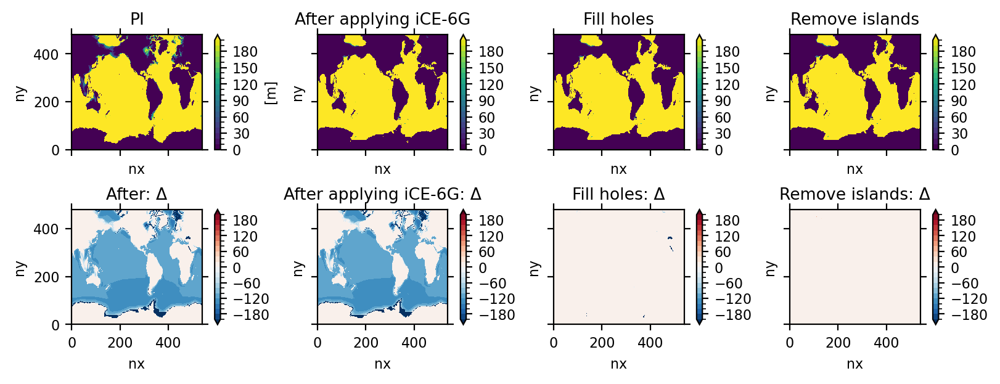

In [25]:
fig, axes = plt.subplots(2, 4, figsize=(8, 3), dpi=200,
                         sharex=True, sharey=True,
                         constrained_layout=True)

for var, title, ax in zip((depth_prei, depth_dSLV, depth_filled, depth_removed),
                          ('PI', 'After applying iCE-6G', 'Fill holes', 'Remove islands'),
                          axes.ravel()[0:4]):
    var.plot(ax=ax, levels=np.linspace(0, 200, 21))
    ax.set_title(title)

for var, title, ax in zip((depth_filled - depth_prei,
                           depth_dSLV - depth_prei,
                           depth_filled - depth_dSLV,
                           depth_removed - depth_filled),
                          ('After: Δ',
                           'After applying iCE-6G: Δ',
                           'Fill holes: Δ',
                           'Remove islands: Δ'),
                          axes.ravel()[4:]):
    var.plot(ax=ax, levels=np.linspace(-200, 200, 21),
             extend='both')
    ax.set_title(title)

### Step 4: Check important channels and regions likely to have problems

In [26]:
depth_21ka = depth_removed.copy(deep=True)

#### Step 4.1: Get back chanels in Sea of Japan

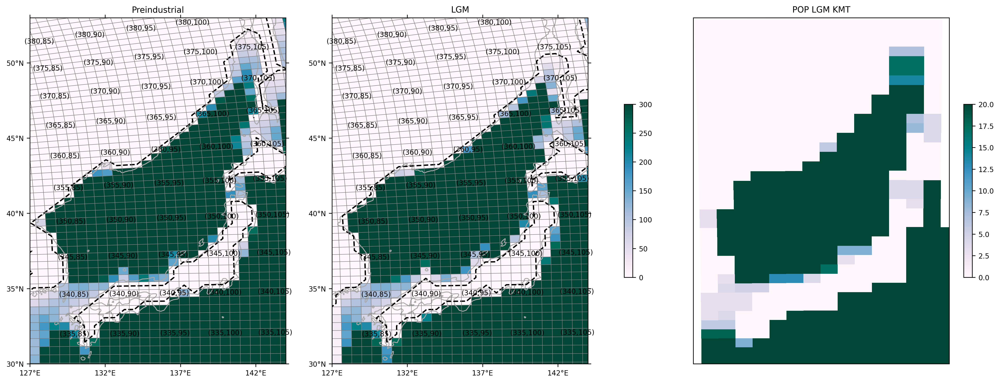

In [27]:
lonbeg = -233
lonend = -216
latbeg = 30
latend = 53

# Get back the south, central, and north channels using preindustrial
replace_depth_box(depth_21ka, depth_prei, [333, 342], [82, 89])
replace_depth_box(depth_21ka, depth_prei, [352, 355], [100, 103])
replace_depth_box(depth_21ka, depth_prei, [361, 364], [103, 107])

plot_depth(depth_prei, depth_21ka,
           ds_mom_prei, ds_pop_21ka,
           lonbeg, lonend, latbeg, latend, skip=5,
           titles=('Preindustrial', 'LGM'))

#### Step 4.2: Get back Red Sea

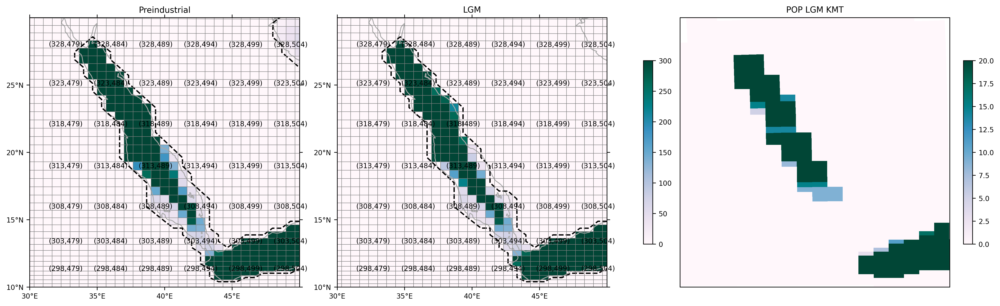

In [28]:
lonbeg = 30
lonend = 50
latbeg = 10
latend = 30

# get back Read Sea using values before filling holes
replace_depth_box(depth_21ka, depth_dSLV, [303, 333], [475, 495])

# get back the channel using preindustrial
replace_depth_box(depth_21ka, depth_prei, [300, 310], [489, 497])

plot_depth(depth_prei, depth_21ka,
           ds_mom_prei, ds_pop_21ka,
           lonbeg, lonend, latbeg, latend, skip=5,
           titles=('Preindustrial', 'LGM'))

#### Step 4.3: Get back Black Sea

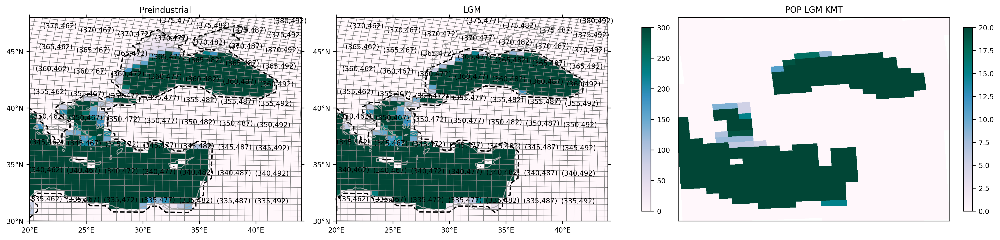

In [29]:
lonbeg = 20
lonend = 44
latbeg = 30
latend = 48

# get back Black Sea using values before filling holes
replace_depth_box(depth_21ka, depth_dSLV, [350, 375], [467, 498])

# get back the channel using preindustrial
replace_depth_box(depth_21ka, depth_prei, [344, 357], [464, 474])

plot_depth(depth_prei, depth_21ka,
           ds_mom_prei, ds_pop_21ka,
           lonbeg, lonend, latbeg, latend, skip=5,
           titles=('Preindustrial', 'LGM'))

#### Step 4.4: Examine Sanda and Sahul shelves

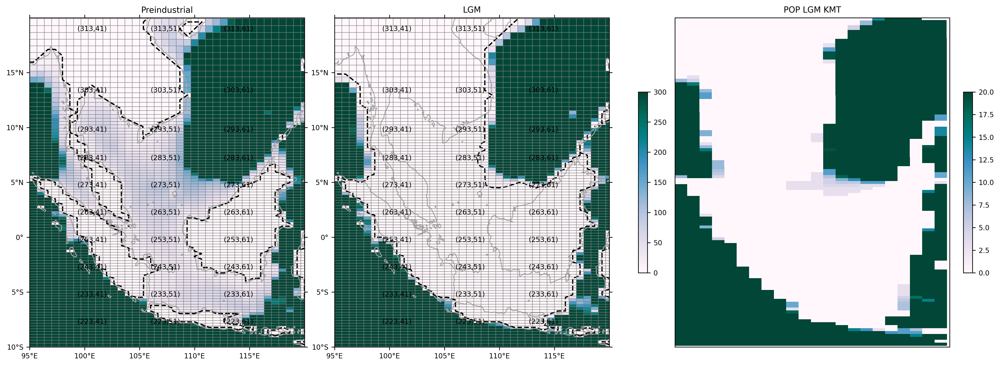

In [30]:
lonbeg = -265
lonend = -240
latbeg = -10
latend = 20

plot_depth(depth_prei, depth_21ka,
           ds_mom_prei, ds_pop_21ka,
           lonbeg, lonend, latbeg, latend, skip=10,
           titles=('Preindustrial', 'LGM'))

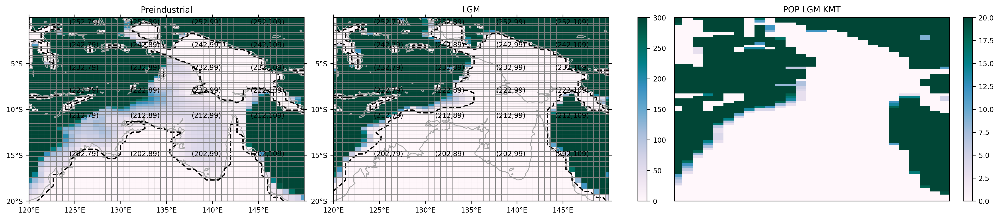

In [31]:
lonbeg = -240
lonend = -210
latbeg = -20
latend = 0

plot_depth(depth_prei, depth_21ka,
           ds_mom_prei, ds_pop_21ka,
           lonbeg, lonend, latbeg, latend, skip=10,
           titles=('Preindustrial', 'LGM'))

#### Step 4.5 Check again

In [32]:
preindustrial_plot = depth_prei.hvplot.quadmesh(
    clim=(0, 200),
    cmap="viridis",
    title="Preindustrial",
    rasterize=True,
)

# LGM
lgm_plot = depth_21ka.hvplot.quadmesh(
    clim=(0, 200),
    cmap="viridis",
    title="LGM",
    rasterize=True,
)

# Difference
diff = depth_21ka - depth_prei

diff_plot = diff.hvplot.quadmesh(
    clim=(-200, 200),
    cmap="RdBu_r",
    title="Difference (LGM - PI)",
    rasterize=True,
)

# Combine side by side
(preindustrial_plot + lgm_plot + diff_plot).cols(2)


:Layout
   .DynamicMap.I   :DynamicMap   []
      :Image   [nx,ny]   (value)
   .DynamicMap.II  :DynamicMap   []
      :Image   [nx,ny]   (value)
   .DynamicMap.III :DynamicMap   []
      :Image   [nx,ny]   (value)

### Step 5: Save a suite of files required for setting up CESM3

In [33]:
%%time

# depth_21ka = xr.where(depth_21ka >= topo_min_depth, depth_21ka, 0)
topo.depth = depth_21ka

topo.write_topo(mom_topo_21ka, title='LGM bathymetry file for MOM6 by Jiang Zhu (jiangzhu@ucar.edu; https://github.com/NCAR/paleowg-recipes/cesm3_lgm)')
topo.write_esmf_mesh(mom_mesh_21ka, title='LGM ESMF mesh file for MOM6 by Jiang Zhu (jiangzhu@ucar.edu; https://github.com/NCAR/paleowg-recipes/cesm3_lgm)')
topo.write_scrip_grid(mom_scrip_21ka, title='LGM SCRIP file for MOM6 by Jiang Zhu (jiangzhu@ucar.edu; https://github.com/NCAR/paleowg-recipes/cesm3_lgm)')
topo.write_cice_grid(cice_grid_21ka)

CPU times: user 1.11 s, sys: 68.2 ms, total: 1.18 s
Wall time: 1.37 s


### Step 6: Create a new 2D background harmonic viscosity field accorcing to the LGM land-sea distribution

In [34]:
ds = xr.open_dataset(mom_topo_21ka)
depth = ds.depth
lath = ds.y
dims = depth.dims
ds

<xarray.Dataset>
Dimensions:  (ny: 480, nx: 540)
Dimensions without coordinates: ny, nx
Data variables:
    y        (ny, nx) float64 ...
    x        (ny, nx) float64 ...
    mask     (ny, nx) int32 ...
    depth    (ny, nx) float32 ...
Attributes:
    date_created:  2026-02-23T19:46:03.594334
    title:         LGM bathymetry file for MOM6 by Jiang Zhu (jiangzhu@ucar.e...
    min_depth:     0.0
    max_depth:     8011.4091796875

In [35]:
# Build mask: 1 over land, 0 over ocean
mask = xr.where(depth > 0.0, 0, 1).astype(float)

# Force cells near Philippines/Indonesian archipelago to land (=1)
mask[259:280, 78] = 1.0

# Taper so the mask smoothly goes to zero within 15° of the equator
fy = (1 - np.minimum(np.abs(lath) / 15, 1) ** 2) ** 2
mask = fy * mask

# Propagate mask values into coastal ocean cells for smooth results.
# Land cells are pinned to their mask value; ocean cells are free to
# receive blended values from neighbors. 1 pass in lonh, 3 passes in lath, 40 times.
KH = mask.copy()
for i in range(40):
    KH = xr.where(mask > 0, mask, KH)
    KH = (1/4) * (2*KH + KH.roll({dims[1]: 1}, roll_coords=False) + KH.roll({dims[1]: -1}, roll_coords=False))
    KH = xr.where(mask > 0, mask, KH)
    KH = (1/4) * (2*KH + KH.roll({dims[0]: 1}, roll_coords=False) + KH.roll({dims[0]: -1}, roll_coords=False))
    KH = xr.where(mask > 0, mask, KH)
    KH = (1/4) * (2*KH + KH.roll({dims[0]: 1}, roll_coords=False) + KH.roll({dims[0]: -1}, roll_coords=False))
    KH = xr.where(mask > 0, mask, KH)
    KH = (1/4) * (2*KH + KH.roll({dims[0]: 1}, roll_coords=False) + KH.roll({dims[0]: -1}, roll_coords=False))

# Final hard reset after the loop
KH = xr.where(mask > 0, mask, KH)

# Mask out E-W edges
# Only do this on the west side, as new islands emerge on the east side.
# This ensures coasts near India and Sri Lanka are similar to the preindustrial file.
KH[250:, :25]  = 0.
# KH[:, -25:] = 0.

# Apply final masking and scaling
KH = xr.where(depth > 0.0, KH, np.nan) * 9000.0

ds_out = KH.rename("KH").to_dataset()
ds_out['KH'].attrs = {"units": "m^2 s^-1", "long_name": "Background harmonic viscosity"}

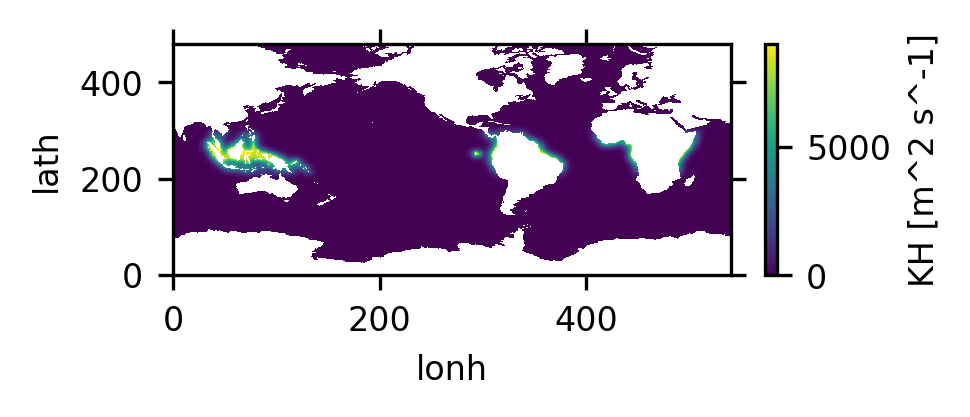

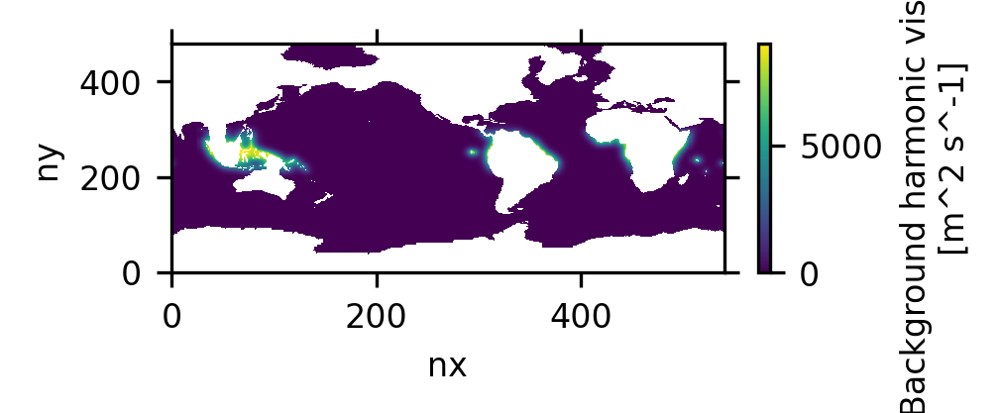

In [36]:
# Make plot to compare with the PI file
ds_PI = xr.open_dataset('/glade/u/home/igrooms/jupyter_notebooks/KH_BG_2D.nc')

ds_PI.KH.plot.pcolormesh(size=1, aspect=3)
ds_out.KH.plot.pcolormesh(size=1, aspect=3)

In [37]:
# Save netcdf file

ds_out.attrs['Title']  = '2D background harmonic viscosity field for LGM'
ds_out.attrs['Author'] = 'Jiang Zhu (jiangzhu@ucar.edu) & Ian Grooms (ian.grooms@colorado.edu)'
ds_out.attrs['Script'] = 'https://github.com/NCAR/paleowg-recipes/cesm3_lgm'
ds_out.attrs['More_info'] = 'https://github.com/NCAR/paleowg-recipes/cesm3_lgm'
ds_out.attrs["Date_created"] = datetime.datetime.now().isoformat()

ds_out.to_netcdf(KH_BG_21ka, format="NETCDF3_64BIT")